In [ ]:
# load WSG
# add annotation to WSG regarding ink, but must be related to detection in original image
# then remove patch features and impute using neighbor features

In [ ]:
# ! git clone https://github.com/jlevy44/PathFlow-MixMatch

In [ ]:
# ! nvidia-smi -l

In [ ]:
# import airlab
# airlab.__file__

In [ ]:
# ! ls -lah /dartfs-hpc/rc/home/w/f003k8w/.local/lib/python3.7/site-packages/airlab/

In [ ]:
# ! pip uninstall -y airlab

In [ ]:
! ls bcc/old

In [1]:
from pathflowai.utils import load_sql_df
df=load_sql_df("bcc/old/patch_info_update.db",256)

nonechucks may not work properly with this version of PyTorch (1.6.0). It has only been tested on PyTorch versions 1.0, 1.1, and 1.2


In [2]:
# df.iloc[:,6:].sum(0)#['Blue_Ink'].sum()

In [3]:
# https://github.com/deroneriksson/python-wsi-preprocessing/blob/master/deephistopath/wsi/filter.py

In [4]:
df=load_sql_df("bcc/patch_info_new.db",256)

In [1]:
import os
os.environ["CV_IO_MAX_IMAGE_PIXELS"] = pow(2,40).__str__()


In [2]:
from PIL import Image
Image.MAX_IMAGE_PIXELS = None
import skimage.io
# arr2=skimage.io.imread("bcc/interactive_test/163_A1a.prob_map.0.png")

In [3]:
import matplotlib
matplotlib.rcParams['figure.dpi']=300
import matplotlib.pyplot as plt


In [4]:
# melanoma practice here

In [5]:
import glob
melanoma_files=glob.glob("../images/melanoma/*")
melanoma_files

['../images/melanoma/340 Debulk_ASAP.tif',
 '../images/melanoma/340 A2-4_ASAP.tif',
 '../images/melanoma/339 B1_ASAP.tif',
 '../images/melanoma/56 A2-4a_ASAP.tif',
 '../images/melanoma/38 DB_ASAP.tif',
 '../images/melanoma/223 A1$3b_ASAP.tif',
 '../images/melanoma/241 A1-3_ASAP.tif',
 '../images/melanoma/314 A1-3b_ASAP.tif',
 '../images/melanoma/338 A2-4_ASAP.tif',
 '../images/melanoma/56 A2-4_ASAP.tif',
 '../images/melanoma/84 A1-3b_ASAP.tif',
 '../images/melanoma/93 A Debulk_ASAP.tif',
 '../images/melanoma/56 A1-3b_ASAP.tif',
 '../images/melanoma/1 _ASAP.tif',
 '../images/melanoma/337 A1-4_ASAP.tif',
 '../images/melanoma/1 E1-2_ASAP.tif',
 '../images/melanoma/1 F1$2_ASAP.tif',
 '../images/melanoma/314 A1-3_ASAP.tif',
 '../images/melanoma/84 B1-2_ASAP.tif',
 '../images/melanoma/84 A1-3a_ASAP.tif',
 '../images/melanoma/263 Debulk_ASAP.tif',
 '../images/melanoma/101 A2-4_ASAP.tif',
 '../images/melanoma/1 D1$2_ASAP.tif',
 '../images/melanoma/56 A1-3_ASAP.tif',
 '../images/melanoma/84 C1-

In [6]:
import numpy as np
img=np.array(Image.open('../images/melanoma/13 A Debulk_ASAP.tif'))#melanoma_files[1]))


In [7]:
import cv2
compression=4
im=cv2.resize(img,None,fx=1/compression,fy=1/compression)#cv2.cvtColor(,cv2.COLOR_BGR2RGB)

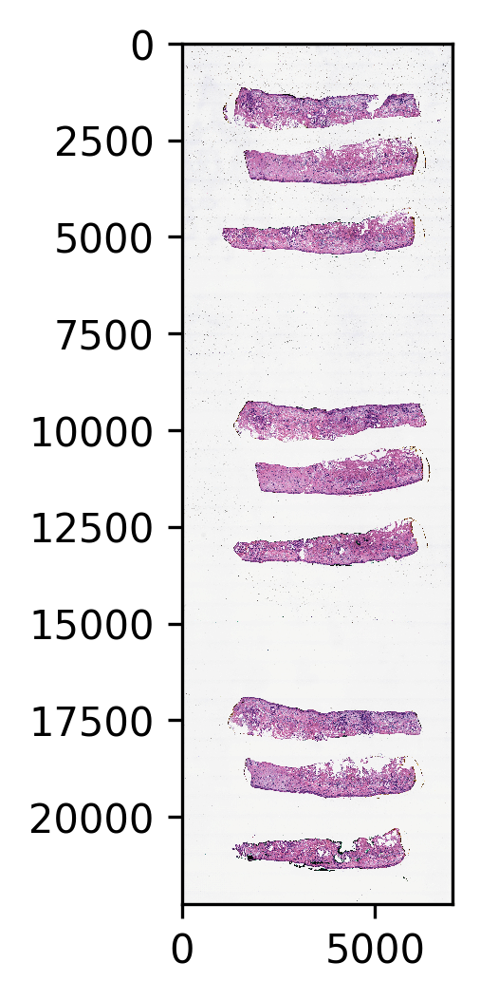

In [8]:
matplotlib.rcParams['figure.dpi']=300

plt.imshow(im)#[2000:2400,2000:2400])

In [8]:
from pathflowai.utils import generate_tissue_mask
from skimage.morphology import disk
from skimage import measure
from scipy.ndimage import binary_opening, binary_dilation

nonechucks may not work properly with this version of PyTorch (1.6.0). It has only been tested on PyTorch versions 1.0, 1.1, and 1.2


In [9]:
import pandas as pd
# properties=pd.DataFrame(measure.regionprops_table(label(im),properties=['label','bbox','area']))

In [10]:
# properties

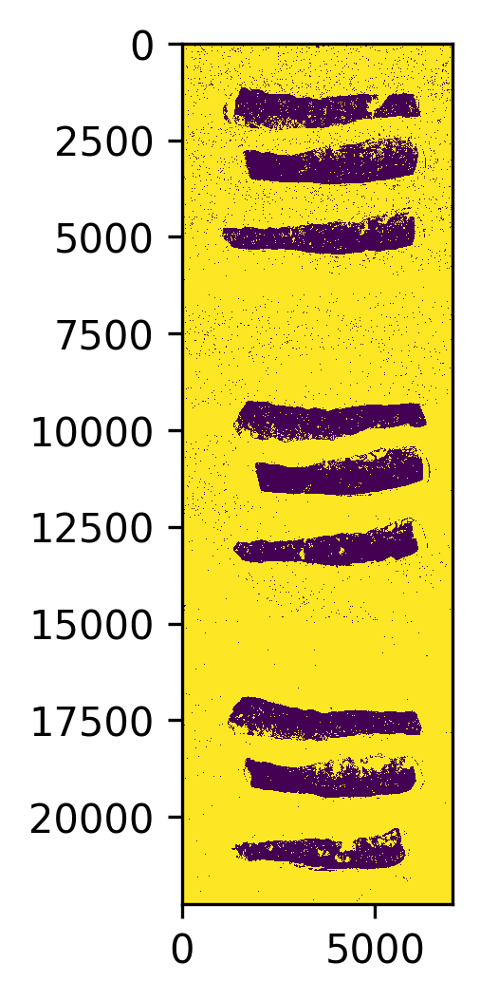

In [11]:
plt.imshow(cv2.cvtColor(im,cv2.COLOR_RGB2GRAY)>230)

In [16]:
from pathflowai.utils import generate_tissue_mask
from skimage.morphology import label
from skimage import filters

tissue_mask_orig=generate_tissue_mask(im,compression=8,threshold=45,min_object_size=10000)


In [25]:
from scipy.ndimage import label as scilabel, distance_transform_edt
lbl=scilabel(tissue_mask_orig)[0]

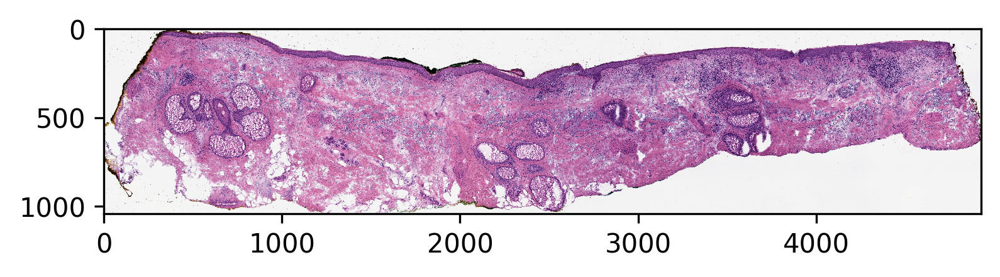

In [22]:
from scipy import ndimage
slice_x, slice_y = ndimage.find_objects(lbl==4)[0]
# plt.imshow(tissue_mask[slice_x, slice_y])
plt.imshow(im[slice_x, slice_y])
# for i in range(1,lbl.max()+1):#np.unique(lbl)
    

In [23]:
# plt.imshow(tissue_mask)

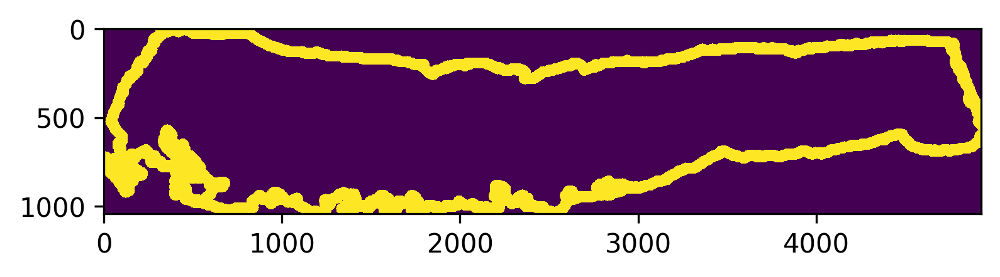

In [32]:
tissue_mask=tissue_mask_orig[slice_x,slice_y].copy()
edges = filters.sobel(tissue_mask)>0

edges = binary_dilation(edges,disk(30,bool))#5
plt.imshow(edges)

In [35]:
from skimage import morphology as morph
from scipy.ndimage import label as scilabel
from sklearn.neighbors import radius_neighbors_graph
from scipy.sparse.csgraph import connected_components
import numpy as np, copy
from filters import filter_red_pen, filter_blue_pen

red_img=filter_red_pen(im[slice_x,slice_y])
blue_img=filter_blue_pen(im[slice_x,slice_y])

arr2=copy.deepcopy(im[slice_x,slice_y])
mask=copy.deepcopy(~red_img)
mask=(binary_dilation(mask,disk(1,bool),iterations=5) & edges)#disk(35,bool)
mask=binary_opening(mask,disk(3,bool),iterations=1)
# print(morph.remove_small_objects(mask, min_size=10, connectivity = 5, in_place=True))
red_mask=morph.remove_small_objects(mask, min_size=100, connectivity = 2, in_place=True)>0

arr2=copy.deepcopy(im[slice_x,slice_y])
mask=copy.deepcopy(~blue_img)
# mask=(binary_dilation(mask,disk(2,bool)) & edges)#disk(35,bool)
mask=(binary_dilation(mask,disk(1,bool),iterations=5) & edges)#disk(35,bool)
mask=binary_opening(mask,disk(3,bool),iterations=1)
blue_mask=morph.remove_small_objects(mask, min_size=30, connectivity = 2, in_place=True)>0#100

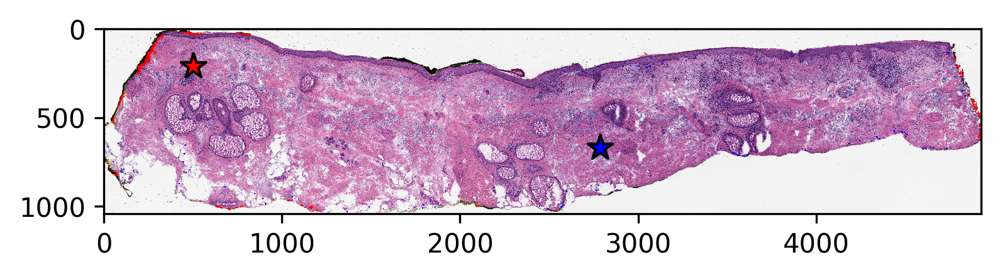

In [36]:
COMed=dict(blue=np.median(np.vstack(np.where(blue_mask)).T,0)[::-1],
    red=np.median(np.vstack(np.where(red_mask)).T,0)[::-1])

arr2=copy.deepcopy(im[slice_x,slice_y])
arr2[red_mask,0]=255
arr2[red_mask,1]=0
arr2[red_mask,2]=0

arr2[blue_mask,0]=0
arr2[blue_mask,1]=0
arr2[blue_mask,2]=255
plt.imshow(arr2)

plt.scatter(*np.vstack([COMed['blue'],COMed['red']]).T.tolist(),c=['blue','red'],marker="*",edgecolors='black',s=100)

In [ ]:
# red, blue, green ok
# black done through filter grays
# yellow purple orange

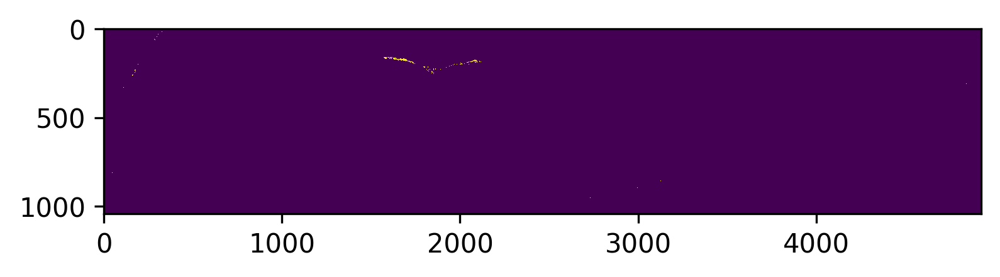

In [60]:
from functools import reduce
def filter_yellow_LAB(img_lab): # # https://www.learnopencv.com/color-spaces-in-opencv-cpp-python/
    return reduce(np.logical_and,([img_lab[...,0]>=20,img_lab[...,0]<=255,
                  img_lab[...,1]>=110,img_lab[...,1]<=140,
                  img_lab[...,2]>=150,img_lab[...,2]<=215]))

# HSV is good for filtering

def filter_orange_HSV(img_hsv): # https://stackoverflow.com/questions/48528754/what-are-recommended-color-spaces-for-detecting-orange-color-in-open-cv
    return cv2.inRange(img_hsv,(10, 100, 20), (25, 255, 255) )
#     return reduce(np.logical_and,([img_lab[...,0]>=20,img_lab[...,0]<=255,
#                   img_lab[...,1]>=110,img_lab[...,1]<=140,
#                   img_lab[...,2]>=150,img_lab[...,2]<=215]))

def filter_black_HSV(img_hsv): # https://stackoverflow.com/questions/48528754/what-are-recommended-color-spaces-for-detecting-orange-color-in-open-cv
    return cv2.inRange(img_hsv,(0, 0, 0), (255, 40, 40) )

plt.imshow(filter_black_HSV(cv2.cvtColor(im[slice_x,slice_y], cv2.COLOR_RGB2HSV)))
# black and orange are the same?
# the ink is dark so the value will naturally be low, but taking down the saturation helps for black
#plt.imshow(filter_yellow_LAB(cv2.cvtColor(im[slice_x,slice_y], cv2.COLOR_RGB2LAB)))

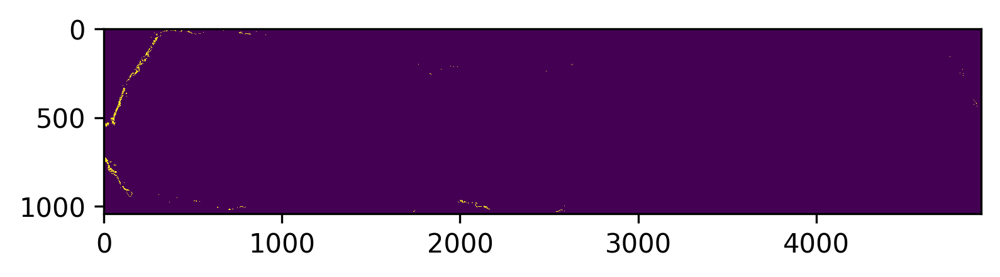

In [61]:
plt.imshow(filter_orange_HSV(cv2.cvtColor(im[slice_x,slice_y], cv2.COLOR_RGB2HSV)))


In [ ]:
from functools import reduce
def filter_orange(img_lab): # https://www.learnopencv.com/color-spaces-in-opencv-cpp-python/
    return reduce(np.logical_and,([img_lab[...,0]>=20,img_lab[...,0]<=255,
                  img_lab[...,1]>=110,img_lab[...,1]<=140,
                  img_lab[...,2]>=150,img_lab[...,2]<=215]))

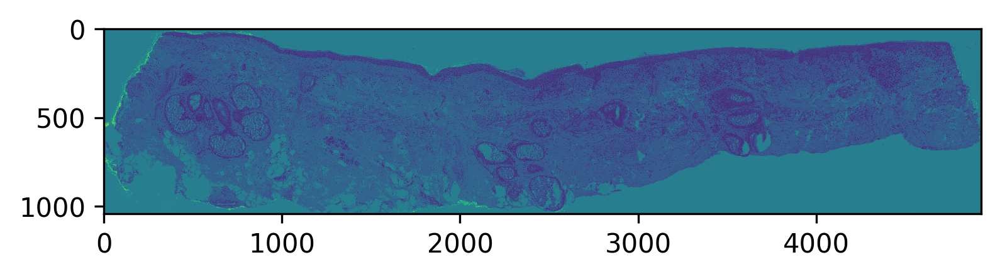

In [39]:
plt.imshow(cv2.cvtColor(im[slice_x,slice_y], cv2.COLOR_RGB2LAB)[...,2])

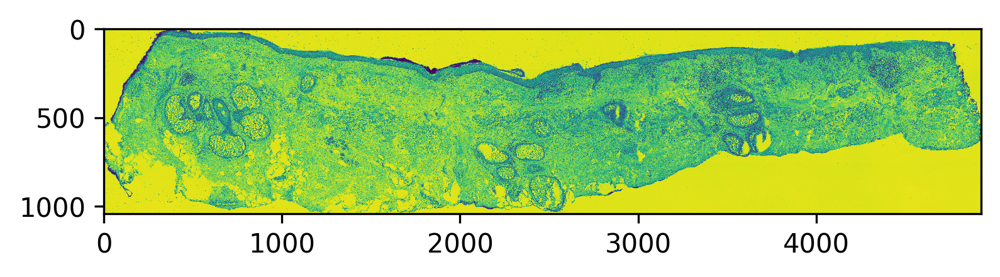

In [40]:
plt.imshow(im[slice_x,slice_y][...,0])

In [ ]:
# see ink calibration

In [ ]:
# ! ls bcc/interactive_test/ -lah

In [ ]:
# arr2.shape
import matplotlib,matplotlib.pyplot as plt

%matplotlib inline
matplotlib.rcParams['figure.dpi']=300

import numpy as np, glob
for f in glob.glob("bcc/inputs/163_A1*.npy"):
    arr=np.load(f)
    plt.figure()
    plt.imshow(arr)
    plt.axis("off")
    del arr



In [ ]:
for f in glob.glob("bcc/interactive_test/163_A1*.png"):
    arr=skimage.io.imread(f)
    plt.figure()
    plt.imshow(arr)
    plt.axis("off")
    del arr

In [79]:
from pathflowai.utils import generate_tissue_mask
from skimage.morphology import disk
from scipy.ndimage import binary_opening, binary_dilation

In [8]:
import glob
from PIL import Image
Image.MAX_IMAGE_PIXELS = None
import skimage.io

f=glob.glob("bcc/interactive_test/163_A1*.png")[0]
arr=skimage.io.imread(f)
# plt.figure()
# plt.imshow(arr)
# plt.axis("off")

In [24]:
import pickle
thumbnails=pickle.load(open('bcc/image_thumbnails_new.pkl','rb'))

In [9]:
from filters import filter_red_pen, filter_blue_pen

In [10]:
red_img=filter_red_pen(arr)
blue_img=filter_blue_pen(arr)

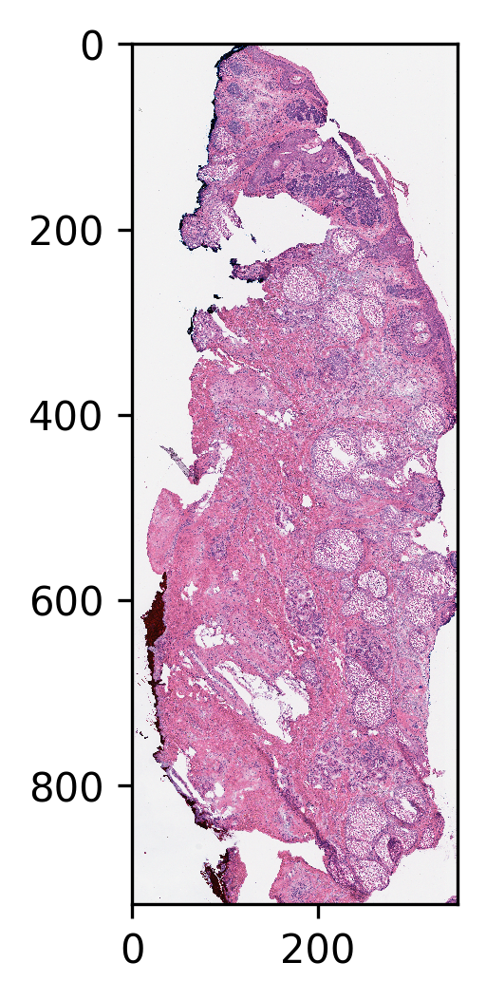

In [66]:
import matplotlib,matplotlib.pyplot as plt
from filters import filter_red_pen, filter_blue_pen
%matplotlib inline
matplotlib.rcParams['figure.dpi']=300
i=26
red_img=filter_red_pen(thumbnails[i])
blue_img=filter_blue_pen(thumbnails[i])
plt.imshow(thumbnails[i])

In [67]:
from pathflowai.utils import generate_tissue_mask
from skimage.morphology import label
from skimage import filters

tissue_mask=generate_tissue_mask(thumbnails[i],compression=1)
edges = filters.sobel(tissue_mask)>0
edges = binary_dilation(edges,disk(5,bool))
plt.imshow(edges)

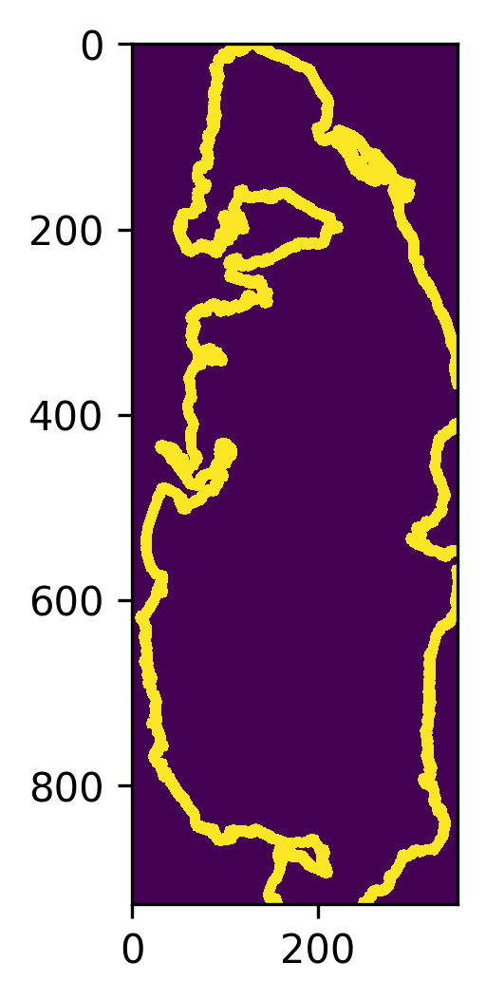

In [74]:
plt.imshow(edges)

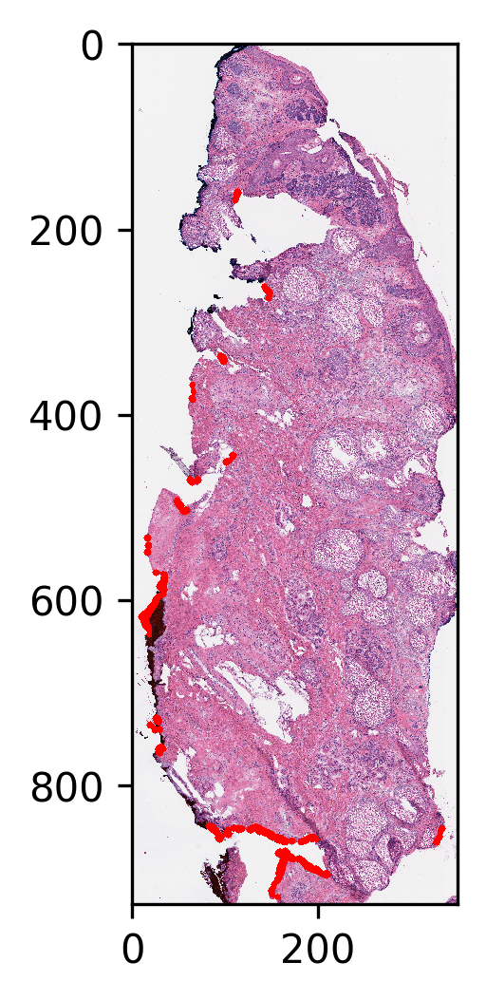

In [135]:
from skimage import morphology as morph
from scipy.ndimage import label as scilabel
from sklearn.neighbors import radius_neighbors_graph
from scipy.sparse.csgraph import connected_components
import numpy as np
arr2=copy.deepcopy(thumbnails[i])
mask=copy.deepcopy(~red_img)
mask=(binary_dilation(mask,disk(1,bool),iterations=5) & edges)#disk(35,bool)
mask=binary_opening(mask,disk(3,bool),iterations=1)
# print(morph.remove_small_objects(mask, min_size=10, connectivity = 5, in_place=True))
red_mask=morph.remove_small_objects(mask, min_size=100, connectivity = 2, in_place=True)>0

arr2=copy.deepcopy(thumbnails[i])
mask=copy.deepcopy(~blue_img)
# mask=(binary_dilation(mask,disk(2,bool)) & edges)#disk(35,bool)
mask=(binary_dilation(mask,disk(1,bool),iterations=5) & edges)#disk(35,bool)
mask=binary_opening(mask,disk(3,bool),iterations=1)
blue_mask=morph.remove_small_objects(mask, min_size=100, connectivity = 2, in_place=True)>0
# mask2=np.zeros(arr2.shape[:2])
# # print(.shape)
# pos_comp=np.vstack(np.where(mask)).T
# G=radius_neighbors_graph(pos_comp,radius=50)
# # print(G.sum(),len(pos_comp))
# # labels=connected_components(G,return_labels=True)[1]
# # comp_size=pd.Series(labels).value_counts()
# # np.isin(labels,comp_size[comp_size>10].index)
# pos_comp=pos_comp[np.asarray(G.sum(axis=0)>5).flatten(),:].T
# print(pos_comp[:,0])
# mask2[pos_comp[:,0],pos_comp[:,1]]=1
# print(disk(3,int).shape)
# print(label(mask,connectivity=7))#plt.imshow(scilabel(mask,structure=disk(3,bool))[0])
# if False:
# mask=mask2#morph.remove_small_objects(label(mask)[0], min_size=10, connectivity = 5, in_place=True)>0
arr2[red_mask,0]=255
arr2[red_mask,1]=0
arr2[red_mask,2]=0
plt.imshow(arr2)

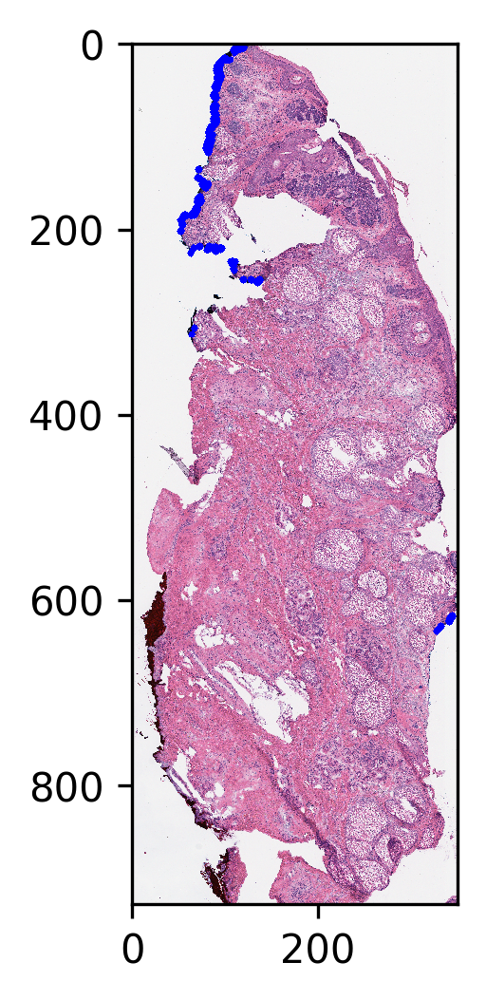

In [136]:


arr2[blue_mask,0]=0
arr2[blue_mask,1]=0
arr2[blue_mask,2]=255
plt.imshow(arr2)

In [139]:
COM=dict(blue=np.vstack(np.where(blue_mask)).T.mean(0)[::-1],
    red=np.vstack(np.where(red_mask)).T.mean(0)[::-1])

In [147]:
COMed=dict(blue=np.median(np.vstack(np.where(blue_mask)).T,0)[::-1],
    red=np.median(np.vstack(np.where(red_mask)).T,0)[::-1])

In [148]:
print(COM,COMed)

{'blue': array([104.26424361, 171.97937132]), 'red': array([109.69012148, 694.52326381])} {'blue': array([ 88., 155.]), 'red': array([107., 766.])}


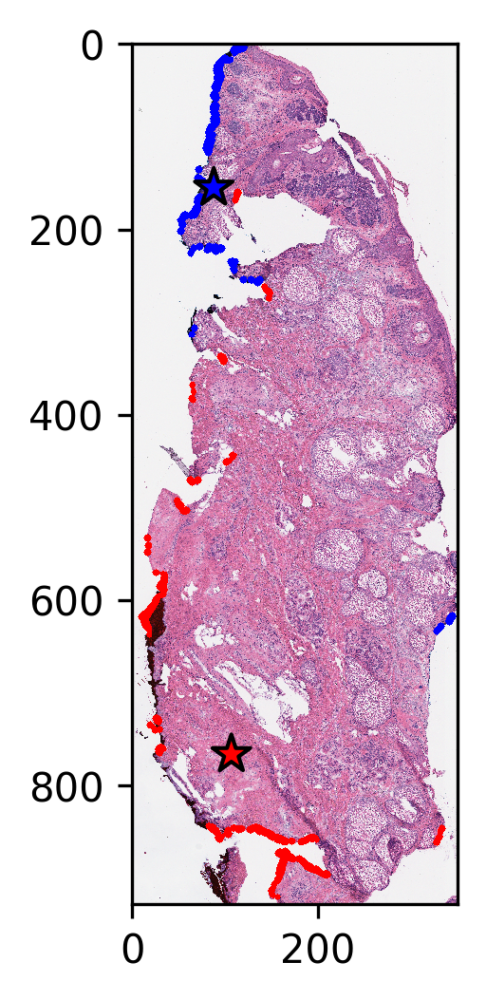

In [152]:
COMed=dict(blue=np.median(np.vstack(np.where(blue_mask)).T,0)[::-1],
    red=np.median(np.vstack(np.where(red_mask)).T,0)[::-1])

arr2=copy.deepcopy(thumbnails[i])
arr2[red_mask,0]=255
arr2[red_mask,1]=0
arr2[red_mask,2]=0

arr2[blue_mask,0]=0
arr2[blue_mask,1]=0
arr2[blue_mask,2]=255
plt.imshow(arr2)

plt.scatter(*np.vstack([COMed['blue'],COMed['red']]).T.tolist(),c=['blue','red'],marker="*",edgecolors='black',s=100)

(-0.5, 7999.5, 9999.5, -0.5)

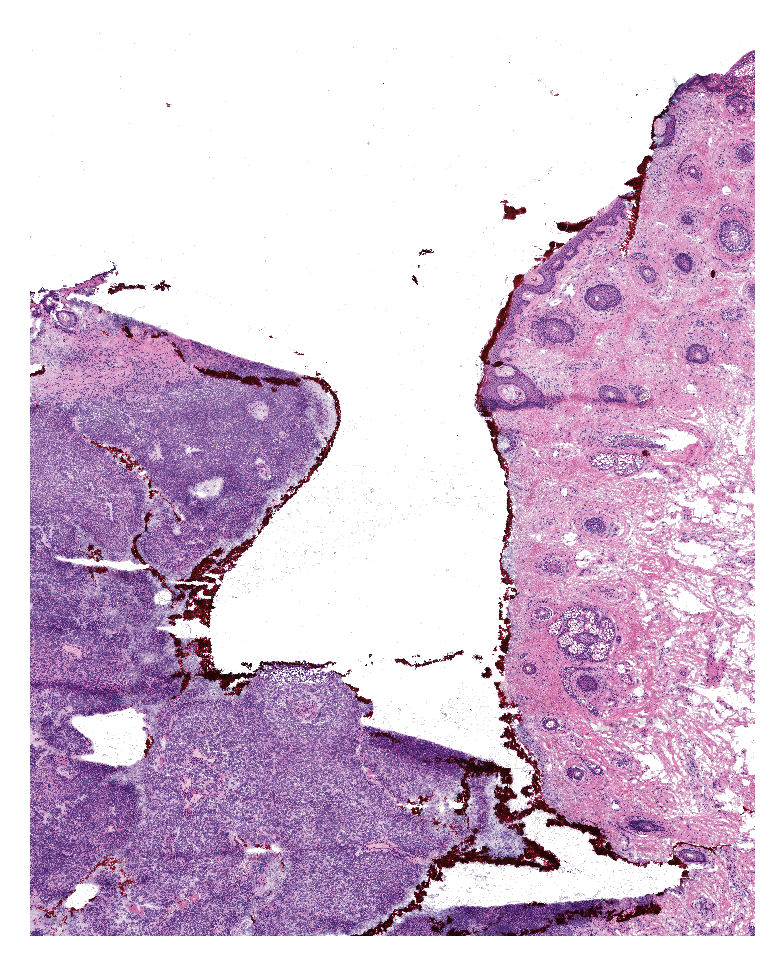

In [11]:
import matplotlib,matplotlib.pyplot as plt

%matplotlib inline
matplotlib.rcParams['figure.dpi']=300

import copy
plt.imshow(arr[:10000,14000:22000])
plt.axis("off")

In [ ]:
# plt.imshow(disk(35,bool))

In [13]:
import copy


In [14]:
arr2=copy.deepcopy(arr[:10000,14000:22000])
mask=copy.deepcopy(~red_img[:10000,14000:22000])
mask=binary_dilation(mask,disk(5,bool))#disk(35,bool)
arr2[mask,0]=255
arr2[mask,1]=0
arr2[mask,2]=0

(-0.5, 7999.5, 9999.5, -0.5)

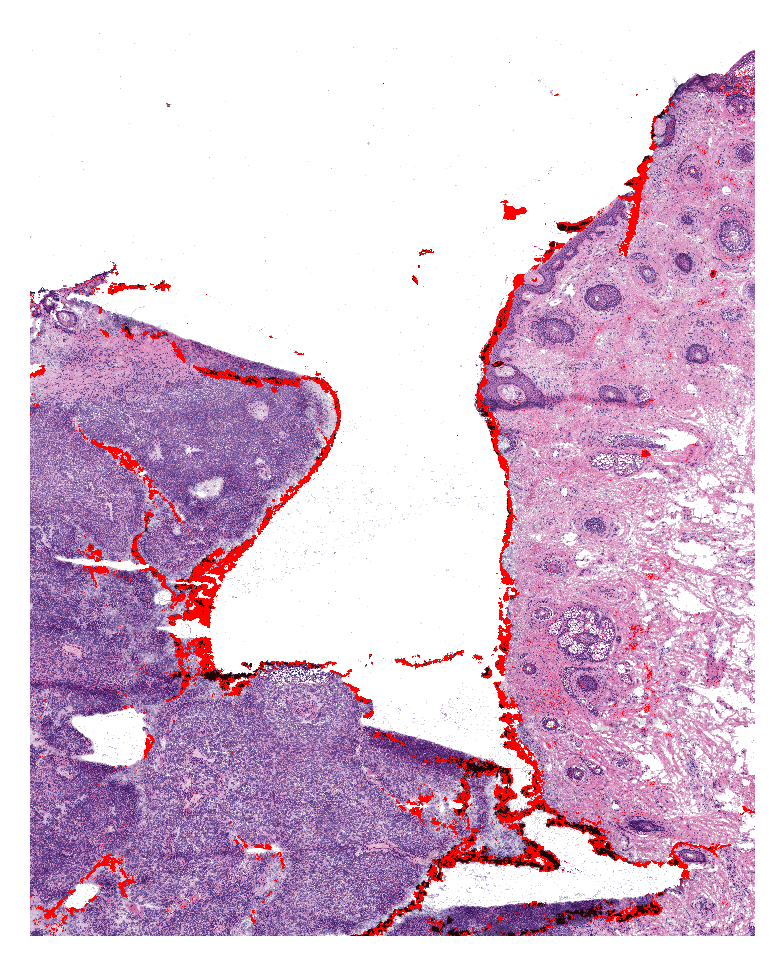

In [15]:
import matplotlib,matplotlib.pyplot as plt

%matplotlib inline
matplotlib.rcParams['figure.dpi']=300

plt.imshow(arr2)
plt.axis("off")

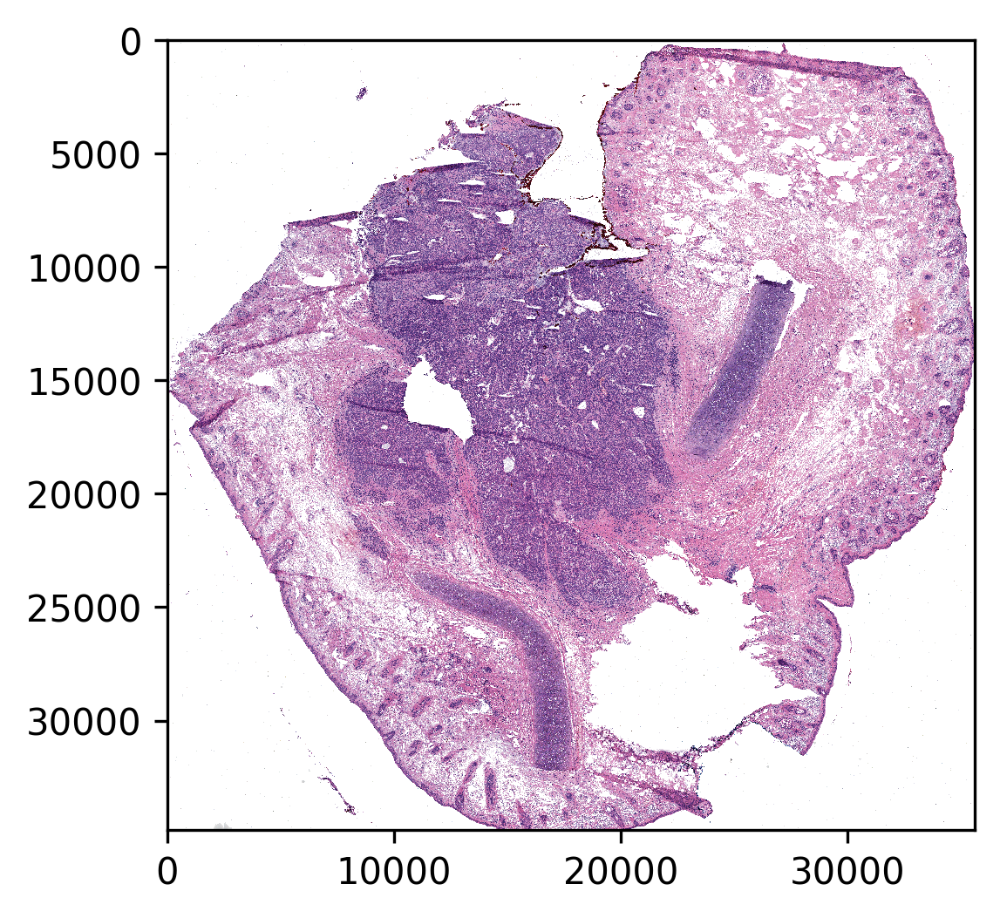

In [21]:
plt.imshow(arr)

(-0.5, 35583.5, 34815.5, -0.5)

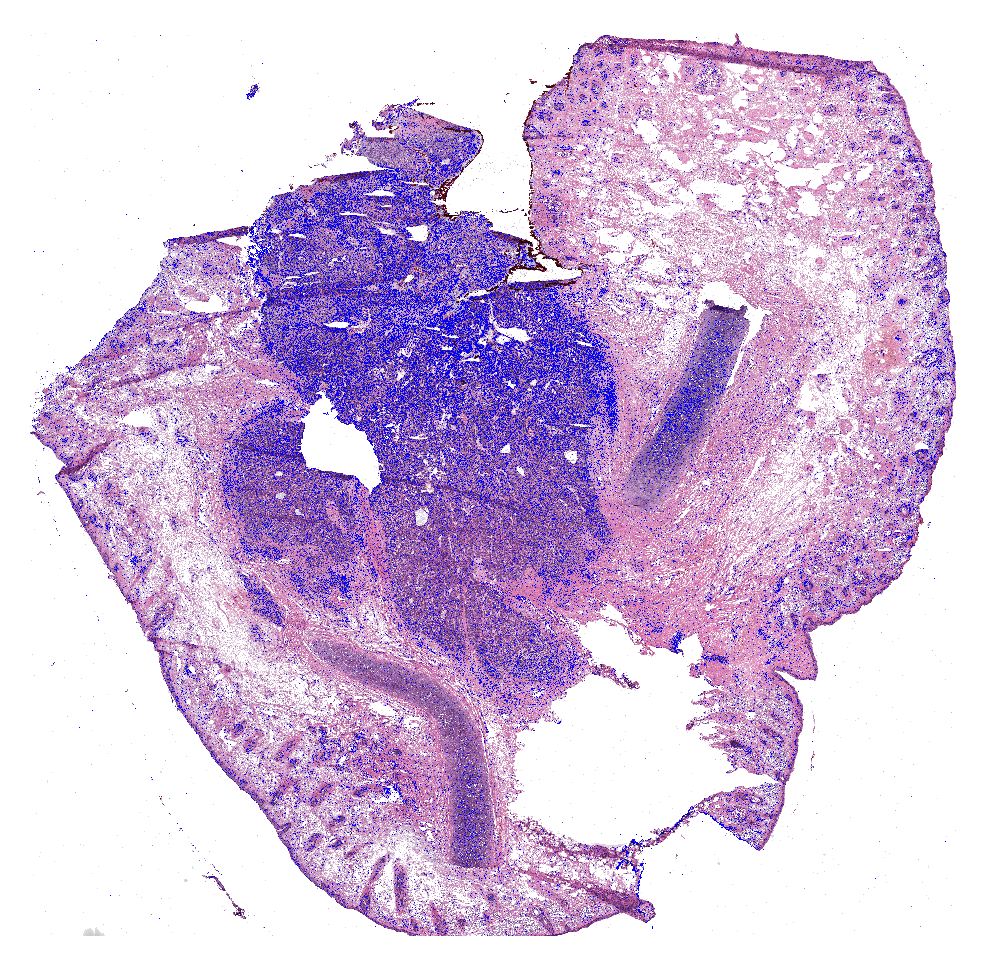

In [22]:
arr2=copy.deepcopy(arr)
mask=copy.deepcopy(~blue_img)
mask=binary_dilation(mask,disk(5,bool))#disk(35,bool)
arr2[mask,0]=0
arr2[mask,1]=0
arr2[mask,2]=255
plt.imshow(arr2)
plt.axis("off")

In [ ]:

#~arr[:10000,10000:20000]

In [ ]:
from pathflowai.utils import generate_tissue_mask
for f in glob.glob("bcc/inputs/163_A1*.npy"):
    arr=generate_tissue_mask(np.load(f))
    plt.figure()
    plt.imshow(arr)
    plt.axis("off")
    del arr

In [ ]:
! ls /dartfs/rc/lab/V/VaickusL_slow/ # get annotations
# find red in annotations
# connected components
# then record where in slide, which patches
# then impute with imagenet features